# Spotify DataSet
### IE7275
### Arnold Chang & Rahul Dixit

## Part 1: Data Exploration

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from tqdm import tqdm
import ast
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline  

In [3]:
df = pd.read_csv('data.csv')
df_artist = pd.read_csv("data_by_artist.csv") 
df_by_genre = pd.read_csv("data_by_genres.csv") 
df_genre = pd.read_csv("data_w_genres.csv") 

In [55]:
df.describe()

,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,mode,popularity,speechiness,tempo,valence,year,duration_s
count,159332.000000,159332.000000,1.593320e+05,159332.000000,159332.000000,159332.000000,159332.000000,159332.00000,159332.000000,159332.000000,159332.000000,159332.000000,159332.000000,159332.000000,159332.000000
mean,0.503535,0.535897,2.320451e+05,0.479718,0.070538,0.195673,5.206506,0.21253,0.702533,26.076432,0.109246,116.989510,0.524749,1976.487190,232.045097
std,0.379445,0.175434,1.486228e+05,0.272067,0.256053,0.333141,3.519700,0.18134,0.457145,22.002006,0.188852,30.186556,0.264065,26.702384,148.622776
min,0.000000,0.055100,1.530700e+04,0.000020,0.000000,0.000000,0.000000,0.00967,0.000000,0.000000,0.022200,30.946000,0.000000,1920.000000,15.307000
25%,0.091400,0.413000,1.654130e+05,0.246000,0.000000,0.000000,2.000000,0.09970,0.000000,1.000000,0.035300,93.754000,0.311000,1955.000000,165.413000
50%,0.528000,0.547000,2.050000e+05,0.460000,0.000000,0.000516,5.000000,0.13900,1.000000,26.000000,0.045700,115.736500,0.536000,1977.000000,205.000000
75%,0.897000,0.668000,2.649470e+05,0.706000,0.000000,0.245000,8.000000,0.27300,1.000000,43.000000,0.077600,135.018000,0.743000,1998.000000,264.947000
max,0.996000,0.988000,5.338302e+06,1.000000,1.000000,1.000000,11.000000,1.00000,1.000000,100.000000,0.971000,243.507000,1.000000,2021.000000,5338.302000


([<matplotlib.patches.Wedge at 0x23bc68953d0>,
 [Text(-1.0609323985436583, 0.2905554090365558, ''),
  Text(0.3959360430719009, -1.026272210379179, ''),
  Text(0.9695316029009697, 0.519623393407453, ''),
  Text(0.1573353992410631, 1.0886898420329159, '')],
 [Text(-0.5786903992056317, 0.15848476856539404, '41.5%'),
  Text(0.215965114402855, -0.5597848420250067, '28.7%'),
  Text(0.5288354197641653, 0.2834309418586107, '25.2%'),
  Text(0.0858193086769435, 0.5938308229270449, '4.6%')])

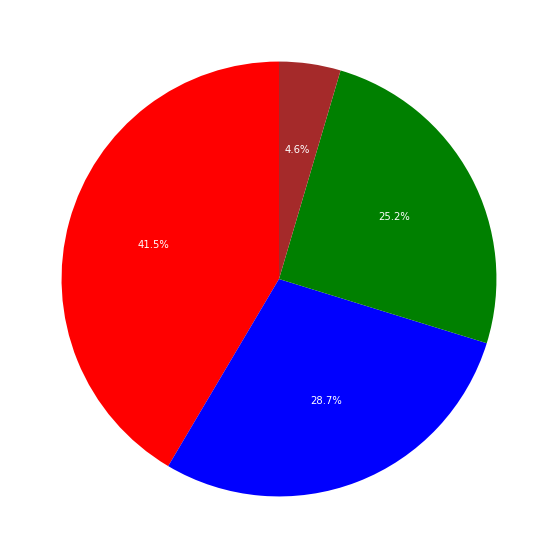

In [5]:
df['duration_s']=df['duration_ms']/1000
df.duration_s.describe()


def transform(x):
  if x <= 100:
    return 'short songs'
  elif x > 100 and x <= 180:
    return 'short-medium songs'
  elif x >180 and x <= 265:
    return 'medium long songs'
  else:
    return 'long songs'

groups_of_duration = df.duration_s.apply(transform)

values = groups_of_duration.value_counts()
labels = values.index
colors = ['red', 'blue', 'green', 'brown']

fig = plt.figure(figsize=(15, 10))
plt.pie(values, colors=colors, autopct='%1.1f%%', startangle=90, textprops={ 'color': 'w' })

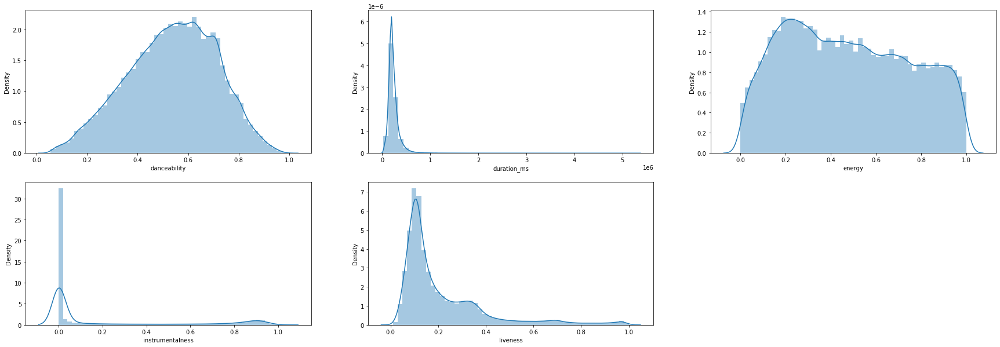

In [60]:
plt.figure(figsize = (30, 10))
plt.subplot(231)
sns.distplot(df['danceability'])
plt.subplot(232)
sns.distplot(df['duration_ms'])
plt.subplot(233)
sns.distplot(df['energy'])
plt.subplot(234)
sns.distplot(df['instrumentalness'])
plt.subplot(235)
sns.distplot(df['liveness'])
plt.show()

<AxesSubplot:xlabel='explicit', ylabel='popularity'>

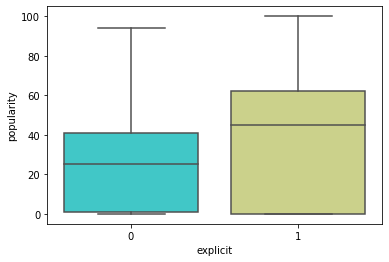

In [8]:
sns.boxplot(x="explicit", y="popularity", data=df,palette='rainbow')

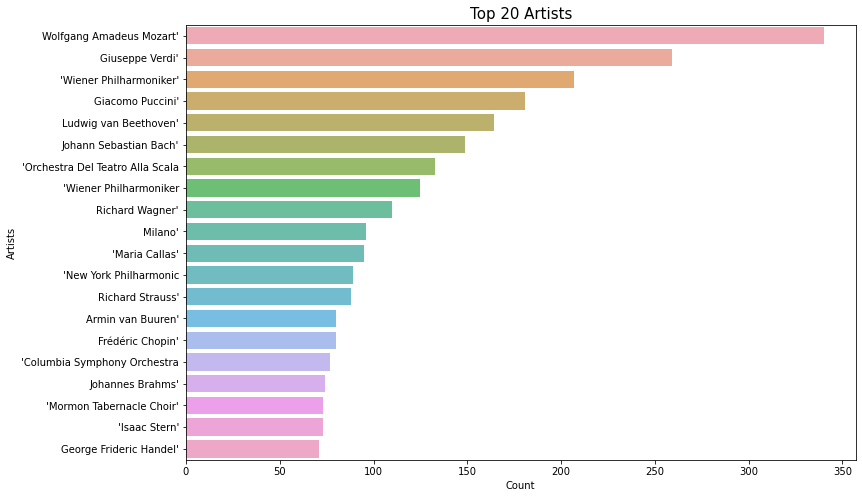

In [9]:
l = []

for i in df.artists:
    a=i[2:-2]
    l.append(a)
l = list(set(l))
lst = []
for i in l:
    res = i.strip('][').split(', ')
    lst.append(res)
d=[]
for i in lst:
    for j in i:
        d.append(j)
dff=pd.DataFrame(d)
dff = dff[0].value_counts()

dff = dff[:20, ]
plt.figure(figsize = (12, 8))
sns.barplot(dff.values, dff.index, alpha = 0.8)
plt.title("Top 20 Artists", fontdict = {'fontsize' : 15})
plt.ylabel("Artists")
plt.xlabel("Count")
plt.show()

<AxesSubplot:xlabel='duration_category', ylabel='popularity'>

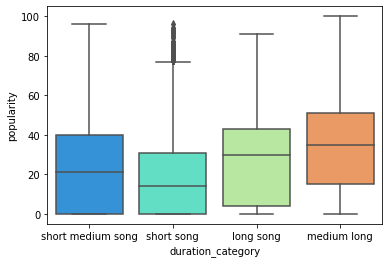

In [10]:
df["duration_category"] = df['duration_s'].apply(lambda x : 'short song' if x <=166
                          else 'short medium song' if x>166 and x<=205 
                          else 'medium long' if x>205 and x <= 265
                          else 'long song' )
sns.boxplot(x="duration_category", y="popularity", data=df,palette='rainbow')

<AxesSubplot:xlabel='explicit', ylabel='popularity'>

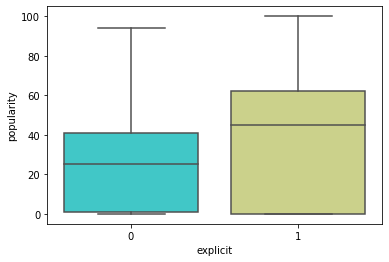

In [11]:
sns.boxplot(x="explicit", y="popularity", data=df,palette='rainbow')

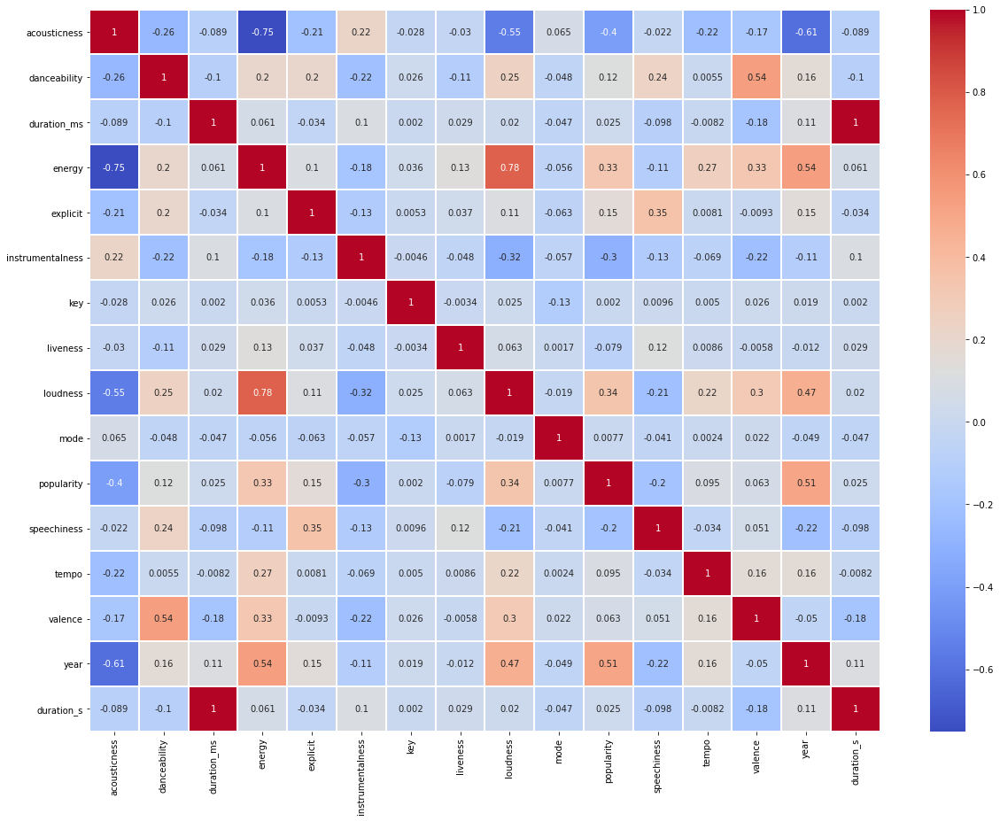

In [12]:
plt.figure(figsize=(20,15))
sns.heatmap(df.corr(),linecolor='white',linewidths=1,annot=True,cmap='coolwarm' )
plt.show()

#We see that energy and loudness have a high correlation


In [13]:
df.drop(columns=['loudness'], inplace=True)
#Dropping Loudness since it has a strong correlation with energy

Text(0.5, 1.0, '% of Songs with Explicit Content')

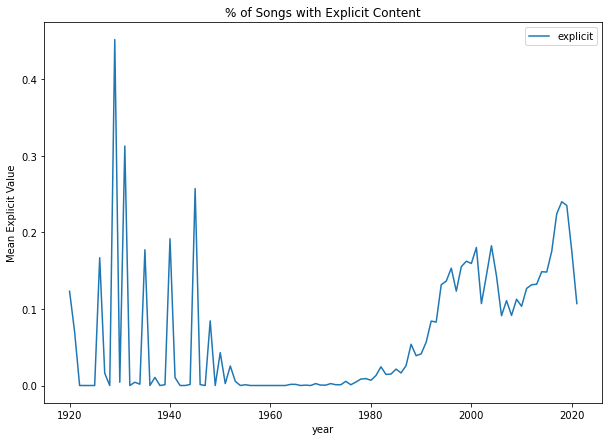

In [14]:
mean_df = df.groupby(df["year"]).mean()
explicit_trend = mean_df[['explicit']].plot.line(figsize = (10, 7))
explicit_trend.set_ylabel('Mean Explicit Value')
explicit_trend.set_title('% of Songs with Explicit Content')

#We see that the explicit content songs were high in the the 30s and then they dipped and started picking up in the 90s

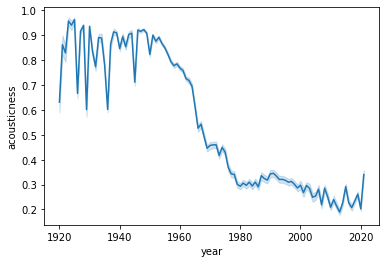

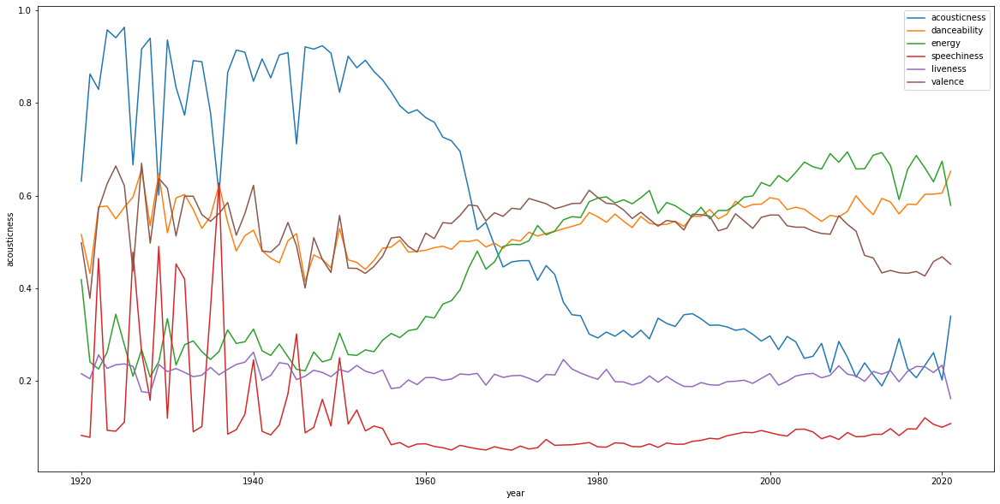

In [15]:
sns.lineplot(x='year',y='acousticness', data=df)

fig,ax = plt.subplots(figsize=(20, 10))
columns = ["acousticness","danceability","energy","speechiness","liveness","valence"]
for col in columns:
    x = df.groupby("year")[col].mean()
    ax= sns.lineplot(x=x.index,y=x,label=col)



(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]),
 [Text(0, 0, "['The Beatles']"),
  Text(1, 0, "['Frank Sinatra']"),
  Text(2, 0, "['Elvis Presley']"),
  Text(3, 0, "['Fleetwood Mac']"),
  Text(4, 0, "['The Rolling Stones']"),
  Text(5, 0, "['Bob Dylan']"),
  Text(6, 0, "['Led Zeppelin']"),
  Text(7, 0, "['Taylor Swift']"),
  Text(8, 0, "['Queen']"),
  Text(9, 0, "['Johnny Cash']"),
  Text(10, 0, "['The Beach Boys']"),
  Text(11, 0, "['Bob Marley & The Wailers']"),
  Text(12, 0, "['David Bowie']"),
  Text(13, 0, "['Pink Floyd']"),
  Text(14, 0, "['Vicente Fernández']"),
  Text(15, 0, "['Elton John']"),
  Text(16, 0, "['Miles Davis']"),
  Text(17, 0, "['Ella Fitzgerald']"),
  Text(18, 0, "['Dean Martin']"),
  Text(19, 0, "['Metallica']"),
  Text(20, 0, "['U2']"),
  Text(21, 0, "['Stevie Wonder']"),
  Text(22, 0, 

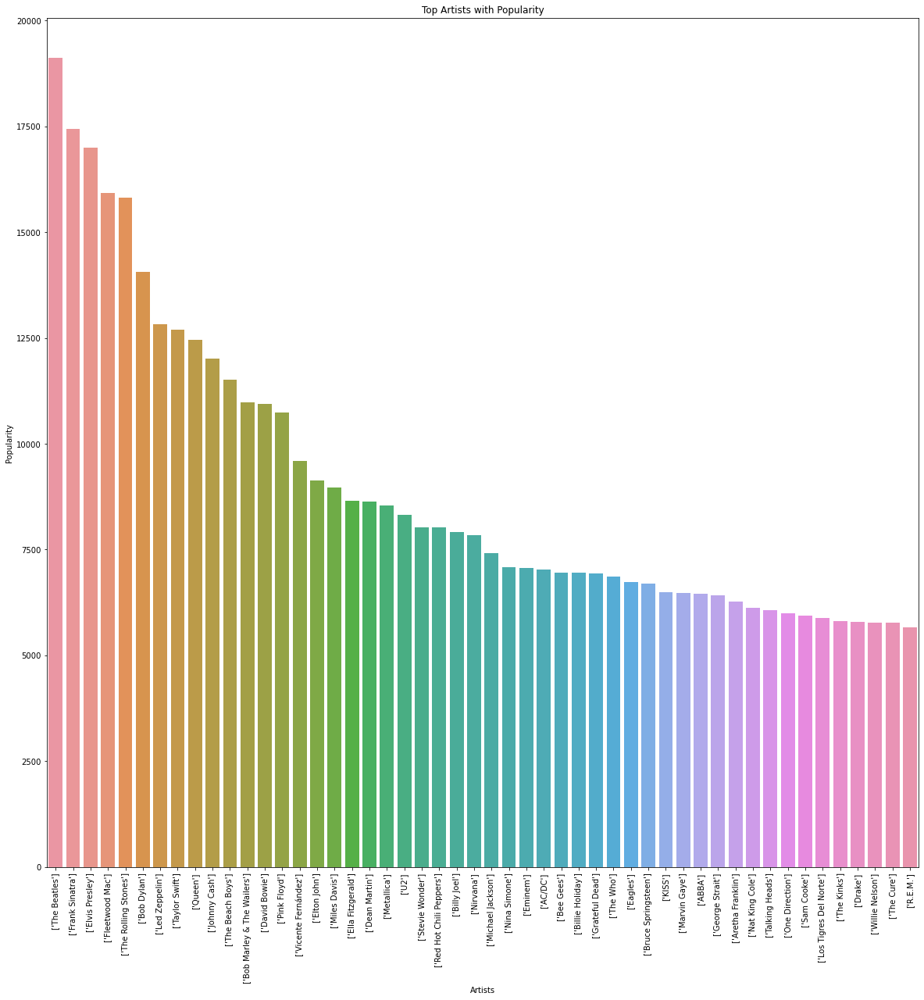

In [16]:
ax.set_ylabel('Measure')
ax.set_xlabel('Year')

fig,ax = plt.subplots(figsize=(20, 20))
pop= df.groupby("artists")['popularity'].sum().sort_values(ascending=False)[:50]
axis = sns.barplot(pop.index, pop)
axis.set_title('Top Artists with Popularity')
axis.set_ylabel('Popularity')
axis.set_xlabel('Artists')
plt.xticks(rotation = 90)



In [18]:
df.drop(columns = 'release_date')
df.drop(columns = 'duration_ms')
df = df[(df['tempo']!= 0)]
df.reset_index(inplace=True, drop=True)
#since tempo = 0 does not make sense , we remove them


df = df.sort_values('popularity',ascending=False).drop_duplicates(subset=['artists', 'name'], keep='first',)
df.describe()

#We have reduced the number of rows from 174389 to 159332

,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,mode,popularity,speechiness,tempo,valence,year,duration_s
count,159332.000000,159332.000000,1.593320e+05,159332.000000,159332.000000,159332.000000,159332.000000,159332.00000,159332.000000,159332.000000,159332.000000,159332.000000,159332.000000,159332.000000,159332.000000
mean,0.503535,0.535897,2.320451e+05,0.479718,0.070538,0.195673,5.206506,0.21253,0.702533,26.076432,0.109246,116.989510,0.524749,1976.487190,232.045097
std,0.379445,0.175434,1.486228e+05,0.272067,0.256053,0.333141,3.519700,0.18134,0.457145,22.002006,0.188852,30.186556,0.264065,26.702384,148.622776
min,0.000000,0.055100,1.530700e+04,0.000020,0.000000,0.000000,0.000000,0.00967,0.000000,0.000000,0.022200,30.946000,0.000000,1920.000000,15.307000
25%,0.091400,0.413000,1.654130e+05,0.246000,0.000000,0.000000,2.000000,0.09970,0.000000,1.000000,0.035300,93.754000,0.311000,1955.000000,165.413000
50%,0.528000,0.547000,2.050000e+05,0.460000,0.000000,0.000516,5.000000,0.13900,1.000000,26.000000,0.045700,115.736500,0.536000,1977.000000,205.000000
75%,0.897000,0.668000,2.649470e+05,0.706000,0.000000,0.245000,8.000000,0.27300,1.000000,43.000000,0.077600,135.018000,0.743000,1998.000000,264.947000
max,0.996000,0.988000,5.338302e+06,1.000000,1.000000,1.000000,11.000000,1.00000,1.000000,100.000000,0.971000,243.507000,1.000000,2021.000000,5338.302000


In [20]:
dff

Wolfgang Amadeus Mozart'            340
Giuseppe Verdi'                     259
'Wiener Philharmoniker'             207
Giacomo Puccini'                    181
Ludwig van Beethoven'               164
Johann Sebastian Bach'              149
'Orchestra Del Teatro Alla Scala    133
'Wiener Philharmoniker              125
Richard Wagner'                     110
Milano'                              96
'Maria Callas'                       95
'New York Philharmonic               89
Richard Strauss'                     88
Armin van Buuren'                    80
Frédéric Chopin'                     80
'Columbia Symphony Orchestra         77
Johannes Brahms'                     74
'Mormon Tabernacle Choir'            73
'Isaac Stern'                        73
George Frideric Handel'              71
Name: 0, dtype: int64

In [21]:

df_ = df.drop(['artists','name','release_date','year','id','duration_category'],axis=1)


In [22]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
scaler = StandardScaler()
scaler.fit(df_)
scaled_data = scaler.transform(df_)
pca = PCA(n_components=10)
pca.fit(scaled_data)
x_pca = pca.transform(scaled_data)

In [23]:
scaled_data.shape

(159332, 14)

In [24]:
x_pca

array([[-1.43323997,  0.59738999,  0.73435019, ...,  2.12981946,
        -0.48415757,  2.76472774],
       [-3.35724708, -0.08867132,  0.37526709, ...,  0.2470928 ,
        -0.17532639,  2.62123307],
       [-3.38811179, -0.16727631,  1.09703506, ..., -1.15058048,
        -0.19414773,  2.66147225],
       ...,
       [ 3.42221994, -1.91832408, -0.64434168, ..., -0.07261209,
        -1.3920812 , -0.34937014],
       [ 1.7029025 , -0.89147289,  0.89737829, ..., -0.07258762,
         0.70275953, -0.49874386],
       [ 3.11386695, -0.56441964, -1.10135835, ...,  0.52054326,
        -0.6376048 ,  0.09542507]])

Text(0, 0.5, 'Second Principal Component')

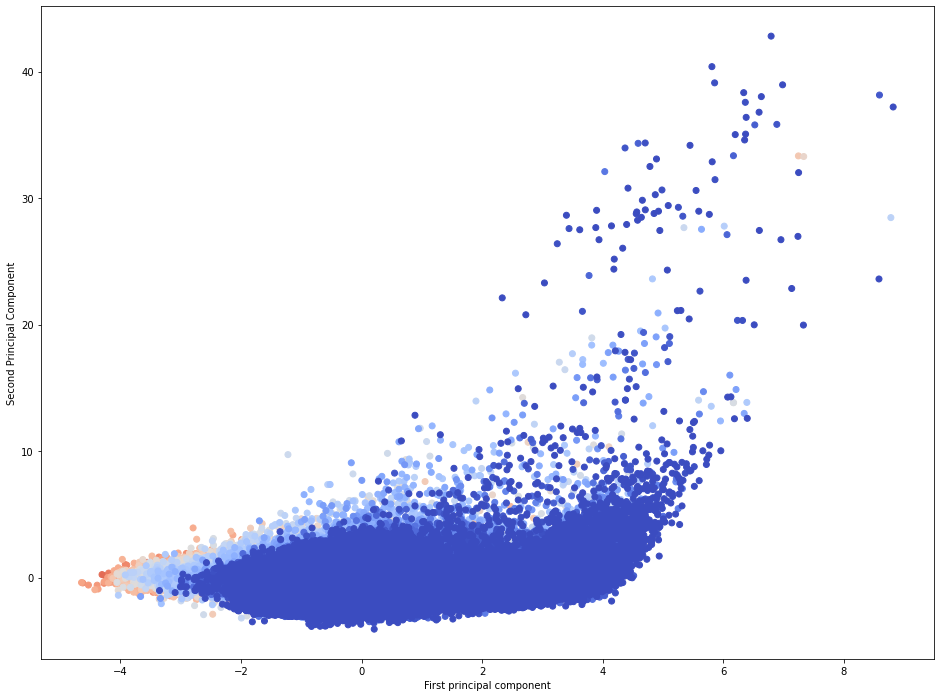

In [25]:
plt.figure(figsize=(16,12))
plt.scatter(x_pca[:,0],x_pca[:,1],c=df['popularity'],cmap='coolwarm' )
plt.xlabel('First principal component')
plt.ylabel('Second Principal Component')

In [ ]:
pca.components_

array([[ 0.46868818, -0.36058819,  0.11056315, -0.45952371, -0.21298333,
         0.30634522, -0.03521314, -0.02353291,  0.03499766, -0.32234868,
        -0.07984075, -0.20275727, -0.34795901,  0.11056315],
       [-0.23456827, -0.14128525,  0.61514125,  0.22512175, -0.04018377,
         0.06519677,  0.01356445,  0.03950634, -0.06166721,  0.17370363,
        -0.20552955,  0.08066257, -0.16493679,  0.61514125],
       [ 0.04778126,  0.26394132,  0.22597319, -0.17808403,  0.47714391,
        -0.07400248,  0.05898255,  0.15863451, -0.1682341 , -0.22547293,
         0.63492253, -0.22212553, -0.02857601,  0.22597319],
       [ 0.17038121,  0.49347957,  0.18380459, -0.11318343, -0.31077823,
         0.09312064,  0.12292134, -0.46860584, -0.05218047, -0.1600919 ,
        -0.1143993 , -0.10282516,  0.50507557,  0.18380459],
       [ 0.06327586,  0.08915581,  0.09270329, -0.16246655,  0.09891317,
        -0.30063906, -0.58676991, -0.19488745,  0.60998176,  0.23048845,
         0.01656125, -0.18

In [ ]:
#standard deviation
np.sqrt(pca.explained_variance_)

array([1.6245392 , 1.47962655, 1.21451243, 1.0881035 , 1.06722006,
       1.05318021, 0.96800038, 0.93671902, 0.8947112 , 0.78283744])

In [ ]:
 pca.explained_variance_ratio_

array([0.18850793, 0.15637721, 0.10535937, 0.0845687 , 0.08135368,
       0.07922726, 0.06692992, 0.06267407, 0.05717879, 0.04377361])

In [ ]:
np.cumsum(pca.explained_variance_ratio_)

array([0.18850793, 0.34488515, 0.45024452, 0.53481322, 0.6161669 ,
       0.69539415, 0.76232407, 0.82499814, 0.88217693, 0.92595055])

In [ ]:
print(pd.DataFrame(pca.components_,columns=dff.columns,index = ['PC-1','PC-2','PC-3','PC-4','PC-5','PC-6','PC-7','PC-8','PC-9','PC-10']))


       acousticness  danceability  duration_ms  ...     tempo   valence  duration_s
PC-1       0.468688     -0.360588     0.110563  ... -0.202757 -0.347959    0.110563
PC-2      -0.234568     -0.141285     0.615141  ...  0.080663 -0.164937    0.615141
PC-3       0.047781      0.263941     0.225973  ... -0.222126 -0.028576    0.225973
PC-4       0.170381      0.493480     0.183805  ... -0.102825  0.505076    0.183805
PC-5       0.063276      0.089156     0.092703  ... -0.188357 -0.032575    0.092703
PC-6       0.044582      0.016159     0.076119  ...  0.299493  0.337227    0.076119
PC-7       0.116207     -0.015162     0.037443  ... -0.441890  0.065475    0.037443
PC-8       0.102130     -0.116537     0.059968  ...  0.631422 -0.063701    0.059968
PC-9       0.236818     -0.074247     0.051480  ...  0.328477  0.035723    0.051480
PC-10      0.400240      0.146117     0.031474  ...  0.173068  0.260076    0.031474

[10 rows x 14 columns]


In [ ]:
df_comp = pd.DataFrame(pca.components_,columns=dff.columns)
df_comp

,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,mode,popularity,speechiness,tempo,valence,duration_s
0,0.468688,-0.360588,0.110563,-0.459524,-0.212983,0.306345,-0.035213,-0.023533,0.034998,-0.322349,-0.079841,-0.202757,-0.347959,0.110563
1,-0.234568,-0.141285,0.615141,0.225122,-0.040184,0.065197,0.013564,0.039506,-0.061667,0.173704,-0.205530,0.080663,-0.164937,0.615141
2,0.047781,0.263941,0.225973,-0.178084,0.477144,-0.074002,0.058983,0.158635,-0.168234,-0.225473,0.634923,-0.222126,-0.028576,0.225973
3,0.170381,0.493480,0.183805,-0.113183,-0.310778,0.093121,0.122921,-0.468606,-0.052180,-0.160092,-0.114399,-0.102825,0.505076,0.183805
4,0.063276,0.089156,0.092703,-0.162467,0.098913,-0.300639,-0.586770,-0.194887,0.609982,0.230488,0.016561,-0.188357,-0.032575,0.092703
5,0.044582,0.016159,0.076119,0.152794,-0.272330,0.071987,-0.248495,0.568778,0.304059,-0.433772,0.119102,0.299493,0.337227,0.076119
6,0.116207,-0.015162,0.037443,-0.046519,-0.242939,-0.483227,0.515391,0.387032,0.200337,0.149878,-0.105813,-0.441890,0.065475,0.037443
7,0.102130,-0.116537,0.059968,-0.175607,0.113079,-0.180750,0.472213,-0.266090,0.403911,-0.036802,0.177376,0.631422,-0.063701,0.059968
8,0.236818,-0.074247,0.051480,-0.228249,-0.205541,-0.583754,-0.290783,0.038964,-0.542611,0.088895,0.020401,0.328477,0.035723,0.051480
9,0.400240,0.146117,0.031474,-0.225058,0.449877,0.260751,0.023806,0.340236,-0.012942,0.383733,-0.366206,0.173068,0.260076,0.031474


In [ ]:
df_comp

,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,mode,popularity,speechiness,tempo,valence,duration_s
0,0.468688,-0.360588,0.110563,-0.459524,-0.212983,0.306345,-0.035213,-0.023533,0.034998,-0.322349,-0.079841,-0.202757,-0.347959,0.110563
1,-0.234568,-0.141285,0.615141,0.225122,-0.040184,0.065197,0.013564,0.039506,-0.061667,0.173704,-0.205530,0.080663,-0.164937,0.615141
2,0.047781,0.263941,0.225973,-0.178084,0.477144,-0.074002,0.058983,0.158635,-0.168234,-0.225473,0.634923,-0.222126,-0.028576,0.225973
3,0.170381,0.493480,0.183805,-0.113183,-0.310778,0.093121,0.122921,-0.468606,-0.052180,-0.160092,-0.114399,-0.102825,0.505076,0.183805
4,0.063276,0.089156,0.092703,-0.162467,0.098913,-0.300639,-0.586770,-0.194887,0.609982,0.230488,0.016561,-0.188357,-0.032575,0.092703
5,0.044582,0.016159,0.076119,0.152794,-0.272330,0.071987,-0.248495,0.568778,0.304059,-0.433772,0.119102,0.299493,0.337227,0.076119
6,0.116207,-0.015162,0.037443,-0.046519,-0.242939,-0.483227,0.515391,0.387032,0.200337,0.149878,-0.105813,-0.441890,0.065475,0.037443
7,0.102130,-0.116537,0.059968,-0.175607,0.113079,-0.180750,0.472213,-0.266090,0.403911,-0.036802,0.177376,0.631422,-0.063701,0.059968
8,0.236818,-0.074247,0.051480,-0.228249,-0.205541,-0.583754,-0.290783,0.038964,-0.542611,0.088895,0.020401,0.328477,0.035723,0.051480
9,0.400240,0.146117,0.031474,-0.225058,0.449877,0.260751,0.023806,0.340236,-0.012942,0.383733,-0.366206,0.173068,0.260076,0.031474


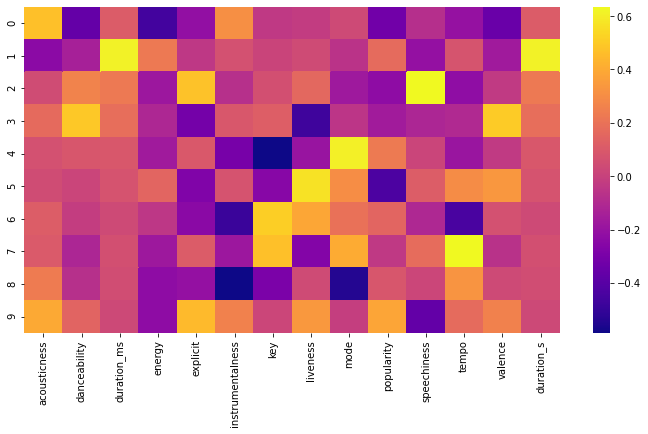

In [ ]:
plt.figure(figsize=(12,6))
sns.heatmap(df_comp,cmap='plasma',)

## Part 2: Genre Analysis using Network Modeling

In [26]:
#standardize data
out_cols = ["genres", "artists", "mode", "count", "key"]
in_cols = [x for x in df_by_genre.columns if x not in out_cols] 

def str2list(x):
    try:
        return ast.literal_eval(x)
    except:
        return np.nan

df_2_std = df_genre.copy()
for col in in_cols:
    df_2_std[col] = (df_genre[col]-df_genre[col].mean())/df_genre[col].std()
       
#extract individual genres from genre lists
df_2_std.reset_index(inplace = True)
collist = list(df_2_std.columns)
new_rows = []
for index in tqdm(range(len(df_2_std))):
    row = df_2_std.iloc[index]
    genre_list = str2list(row["genres"])
    row = pd.DataFrame(row).transpose()
    if(not(isinstance(genre_list, list) and len(genre_list) != 0)):
        pass
    else:
        if(len(genre_list) == 1):
            row["genres"] = genre_list[0]
            new_rows.append(list(row.values[0]))
        else:
            row = pd.concat([row for i in range(len(genre_list))], 0)
            row["genres"] = genre_list
            for i in range(len(genre_list)):
                new_rows.append(list(row.values[i]))
                
df_known = pd.DataFrame(new_rows, columns = collist)
X_known = df_known[in_cols]
y_known = df_known["genres"]



#missing data
df_unknown = df_2_std[df_2_std["genres"] == 0]
X_unknown = df_unknown[in_cols]
y_unknown = df_unknown["genres"]

100%|███████████████████████████████████████████████████████████████████████████| 32539/32539 [02:08<00:00, 252.62it/s]


In [30]:
import itertools, nltk

def unigrams_wrapper(sent):
    return list(nltk.ngrams(sent, 1))
def bigrams_wrapper(sent):
    return list(nltk.ngrams(sent, 2))
def trigrams_wrapper(sent):
    return list(nltk.ngrams(sent, 3))
def quadgrams_wrapper(sent):
    return list(nltk.ngrams(sent, 4))
def fivegrams_wrapper(sent):
    return list(nltk.ngrams(sent, 5))
def sixgrams_wrapper(sent):
    return list(nltk.ngrams(sent, 6))


freq_dist = []

list_func = [unigrams_wrapper, bigrams_wrapper, trigrams_wrapper, quadgrams_wrapper, fivegrams_wrapper, sixgrams_wrapper]

for i in tqdm((range(0,6))):
    tokenized = map(nltk.tokenize.word_tokenize, y_known)

    bigrams = map(list_func[i], tokenized)

    bigram = list(itertools.chain.from_iterable(bigrams))

    dist = nltk.FreqDist(bigram)

    #prob_dist = nltk.MLEProbDist(freq_dist)
    #number_of_bigrams = freq_dist.N()
    freq_dist.append(dist)

100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [01:14<00:00, 12.47s/it]


In [31]:
freq_dist[0].most_common(10)

[(('rock',), 8180),
 (('pop',), 7752),
 (('hip',), 2814),
 (('hop',), 2565),
 (('rap',), 2487),
 (('jazz',), 2409),
 (('country',), 1979),
 (('indie',), 1975),
 (('metal',), 1734),
 (('classic',), 1681)]

In [32]:
freqdf0 = pd.DataFrame(freq_dist[0].most_common(10000))
freqdf1 = pd.DataFrame(freq_dist[1].most_common(10000))
freqdf2 = pd.DataFrame(freq_dist[2].most_common(10000))
freqdf3 = pd.DataFrame(freq_dist[3].most_common(10000))
freqdf4 = pd.DataFrame(freq_dist[4].most_common(10000))
pd.concat([freqdf0,freqdf1,freqdf2,freqdf3,freqdf4],axis=0)


,0,1
0,"(rock,)",8180
1,"(pop,)",7752
2,"(hip,)",2814
3,"(hop,)",2565
4,"(rap,)",2487
...,...,...
5,"(black, ', n, ', roll)",2
6,"(death, ', n, ', roll)",2
7,"(r, &, b, en, espanol)",2
8,"(japanese, old, school, hip, hop)",2


'Rock' and 'Pop' are the 1st and 2nd most frequent unigram. This makes sense as the dataset appears to be heavy in these two genres and subgenres. However, note that 'hip' and 'hop' appear 3rd and 4th most frequently. We cannot consider 'hip' and 'hop' to be considered as genres of their own so we will develop a technique to penalize the score of pseudo genres.

In [33]:
freq_dist[1].most_common(10)

[(('hip', 'hop'), 2487),
 (('r', '&'), 634),
 (('&', 'b'), 634),
 (('new', 'wave'), 580),
 (('dance', 'pop'), 580),
 (('alternative', 'rock'), 551),
 (('country', 'rock'), 533),
 (('pop', 'rap'), 488),
 (('pop', 'rock'), 403),
 (('adult', 'standards'), 395)]

'Hip Hop' is the most frequent bigram, which again is validated by a quick scan of the dataset. However, 'r &' and '& b' are the next most frequent bigrams. This is similar to the issue we faced with 'hip' and 'hop' being the 3rd and 4th most frequent unigram. We will use a similar technique to penalize pseudo bigram genres.

In [ ]:
freq_dist[2].most_common(10)

[(('r', '&', 'b'), 634),
 (('new', 'wave', 'pop'), 312),
 (('southern', 'hip', 'hop'), 301),
 (('brill', 'building', 'pop'), 281),
 (('hardcore', 'hip', 'hop'), 199),
 (('new', 'jack', 'swing'), 187),
 (('underground', 'hip', 'hop'), 177),
 (('stomp', 'and', 'holler'), 176),
 (('alternative', 'hip', 'hop'), 167),
 (('classic', 'uk', 'pop'), 164)]

'R & b' is the most frequent trigram. However, is it clear that 'brill building pop' and 'stomp and holler' are genres of their own, or are they simply substrings of a valid genre? 

In [ ]:
freq_dist[3].most_common(10)

[(('east', 'coast', 'hip', 'hop'), 148),
 (('alternative', 'r', '&', 'b'), 106),
 (('pop', 'r', '&', 'b'), 96),
 (('old', 'school', 'hip', 'hop'), 72),
 (('indie', 'r', '&', 'b'), 40),
 (('contemporary', 'r', '&', 'b'), 33),
 (('chill', 'r', '&', 'b'), 31),
 (("'", 'n', "'", 'roll'), 27),
 (('canadian', 'contemporary', 'r', '&'), 23),
 (('punk', "'", 'n', "'"), 23)]

In [ ]:
freq_dist[4].most_common(10)

[(('canadian', 'contemporary', 'r', '&', 'b'), 23),
 (('punk', "'", 'n', "'", 'roll'), 23),
 (('uk', 'contemporary', 'r', '&', 'b'), 10),
 (('deep', 'east', 'coast', 'hip', 'hop'), 8),
 (('old', 'school', 'uk', 'hip', 'hop'), 2),
 (('black', "'", 'n', "'", 'roll'), 2),
 (('death', "'", 'n', "'", 'roll'), 2),
 (('r', '&', 'b', 'en', 'espanol'), 2),
 (('japanese', 'old', 'school', 'hip', 'hop'), 2),
 (('new', 'wave', 'of', 'thrash', 'metal'), 2)]

In [ ]:
freq_dist[5].most_common(10)

[]

In [34]:
import copy
res = []
res_n = []
freq_dist_copy = copy.deepcopy(freq_dist)
for i in range(0,len(freq_dist)):
    res.append([list(ele) for ele in freq_dist_copy[i].most_common()])
    res_n.append([list(ele) for ele in freq_dist[i].most_common()])

In [35]:
connections = []

# Here, we penalize pseudo n-gram genres by checking to see how many times an n-gram representation of a genre
# is actually part of an (n+1)-gram genre. For instance, although 'hip' frequently occur as a unigram,
# we suspect it occurs equally as much or more so as part of a bigram ('hip hop', 'southern hip', 'latin hop', etc.)
# We penalize by a straightforward subtraction of the counts of (n+1)-gram from the ngram. 

# hip occurs 2814 times.
# 'hip hop' occurs 2487 times.


for i in [4,3,2,1]:
    for j in range(0,len(res_n[i])):
        for k in range(0,len(res_n[i-1])):
            if (set(res_n[i-1][k][0]) <= set(res_n[i][j][0])):
                res[i-1][k][1] = res[i-1][k][1] - res_n[i][j][1]

In [36]:
def takeSecond(elem):
    return elem[1]
res[0].sort(reverse=False, key=takeSecond )
res[1].sort(reverse=False, key=takeSecond )
res[0][:10]

[[('hip',), -1999],
 [('&',), -634],
 [('and',), -360],
 [('r',), -347],
 [('wave',), -309],
 [('building',), -281],
 [('coast',), -279],
 [('alternative',), -274],
 [('jack',), -187],
 [('regional',), -171]]

By sorting the unigrams ascending, we see that 'hip' has a negative score of -1999, followed by the unigrams '&', 'and', etc., all of which intuitively cannot be considered genres of their own but rather a constituent of actual genres. 

In [ ]:
res[1][:10]

[[('deep', 'deep'), -535],
 [('r', '&'), -347],
 [('coast', 'hip'), -148],
 [('school', 'hip'), -74],
 [("'", 'n'), -54],
 [('n', "'"), -54],
 [('christian', 'rock'), -53],
 [('italian', 'pop'), -46],
 [('american', 'classical'), -45],
 [('deep', 'pop'), -40]]

By sorting the bigrams ascending, we similarly see pseudo-genres such as 'deep deep' and 'r &'. 

In [ ]:
res[0].sort(reverse=True, key=takeSecond )
res[1].sort(reverse=True, key=takeSecond )

In [ ]:
res[0][:10]

[[('rock',), 580],
 [('rap',), 496],
 [('pop',), 437],
 [('trap',), 344],
 [('latin',), 339],
 [('funk',), 321],
 [('soul',), 271],
 [('edm',), 268],
 [('tropical',), 262],
 [('electropop',), 254]]

By sorting by descending, we see valid genres sorted by confidence of their validity such as 'rock', 'rap', and 'pop'.

In [ ]:
res[1][:10]

[[('dance', 'pop'), 573],
 [('hip', 'hop'), 487],
 [('pop', 'rap'), 462],
 [('country', 'rock'), 429],
 [('urban', 'contemporary'), 374],
 [('pop', 'rock'), 373],
 [('soft', 'rock'), 368],
 [('mellow', 'gold'), 368],
 [('adult', 'standards'), 360],
 [('album', 'rock'), 332]]

In [39]:
res[0].sort(reverse=True, key=takeSecond )
res[1].sort(reverse=True, key=takeSecond )
res[2].sort(reverse=True, key=takeSecond )
res[3].sort(reverse=True, key=takeSecond )
res[4].sort(reverse=True, key=takeSecond )
freqdf0 = pd.DataFrame(res[0],columns=['A','B'])
freqdf1 = pd.DataFrame(res[1],columns=['A','B'])
freqdf2 = pd.DataFrame(res[2],columns=['A','B'])
freqdf3 = pd.DataFrame(res[3],columns=['A','B'])
freqdf4 = pd.DataFrame(res[4],columns=['A','B'])
res_df = pd.concat([freqdf0,freqdf1,freqdf2,freqdf3,freqdf4],axis=0)

res_df['A']=res_df['A'].agg(' '.join)
res_df = res_df.sort_values(by=['B'],ascending=False)
res_df.reset_index(inplace=True, drop=True)
res_df.head()

,A,B
0,rock,580
1,dance pop,573
2,rap,496
3,hip hop,487
4,pop rap,462


In [40]:
y_known_df = pd.DataFrame(y_known.value_counts())
y_known_df.reset_index(inplace=True)
y_known_df.columns = ['A','B']
y_known_df.head()

,A,B
0,rock,601
1,pop,582
2,dance pop,576
3,rap,498
4,hip hop,487


In [43]:
start_search = res_df[res_df['B']==0].index[0]

for i in range(start_search,len(res_df)):
    for j in range(0,len(y_known_df)):
        if(res_df['A'].iloc[i] == y_known_df['A'].iloc[j]):
            if(res_df.iloc[i][1]<-20):
                print(res_df.iloc[i], y_known_df.iloc[j])

A    italian pop
B            -46
Name: 5254, dtype: object A    italian pop
B              1
Name: 3174, dtype: object
A    christian rock
B               -53
Name: 5259, dtype: object A    christian rock
B                40
Name: 378, dtype: object
A    classical
B         -132
Name: 5279, dtype: object A    classical
B          187
Name: 66, dtype: object
A    wave
B    -309
Name: 5293, dtype: object A    wave
B       5
Name: 1483, dtype: object


'Italian pop' as a genre appears once in the original dataset, but since the number of subgenres of 'italian pop' far outnumber 'italian pop' itself, our algorithm gives 'italian pop' a negative score (-46). This negative score can be interpreted as being not unique enough of a genre to allow inheritance down the tree. However, a negative score for a genre does not preclude it from inheriting from a parent genre - so long as it has at least one parent genre with a positive score. In other words, a negative score for 'italian pop' prevents subgenres to inherit from it; however, it will still allow 'italian pop' to inherit from a 'pop', which as a positive score (437). Another example of a genre not allowing children but allowing parents is 'christian rock'.

Contrast the analysis of 'italian pop' with that of 'classical', which has a score of -132. At first, this doesn't make sense, as we think of 'classical' as very much a valid parent genre. However, in the original dataset, 'classical' is tagged only 187 times. 'Classical performance', meanwhile, occurs a whopping 279 times, classical piano 94 times, classical soprano 90 times, etc. In the dataset by artists which lists all the genres they are associated with, if an artist is associated with a genre, they should also be associated with all valid parent genres. For instance, an artist tagged with 'classical performance' should also be tagged as 'classical' if 'classical' is deemed as a valid parent genre. Therefore, if any count of a genre exceeds that of a parent genre candidate, there have been more than one instance where the genre was tagged WITHOUT the parent genre, thus indicating that the parent genre may not actually be a valid parent genre.


In [46]:
res[1][:10]

[[('dance', 'pop'), 573],
 [('hip', 'hop'), 487],
 [('pop', 'rap'), 462],
 [('country', 'rock'), 429],
 [('urban', 'contemporary'), 374],
 [('pop', 'rock'), 373],
 [('soft', 'rock'), 368],
 [('mellow', 'gold'), 368],
 [('adult', 'standards'), 360],
 [('album', 'rock'), 332]]

In [47]:
freq_dist[0].most_common(1000) #1644 classical
res[0][:10]

[[('rock',), 580],
 [('rap',), 496],
 [('pop',), 437],
 [('trap',), 344],
 [('latin',), 339],
 [('funk',), 321],
 [('soul',), 271],
 [('edm',), 268],
 [('tropical',), 262],
 [('electropop',), 254]]

Now we seek to construct a network of the valid genres and their inheritance. For instance, 'east coast hip hop' intuitively inherits from 'hip hop'. We will assume the following:

0. In the original dataset, if an artist was tagged with a certain genre, he/she would also be taggged with all valid parent genres. (so if an artist was tagged with 'classical piano' he/she would also be tagged with 'classical')
1. There are a maximum possible 5 levels of inheritance, each corresponding to an n-gram.
2. A subgenre (such as 'east coast hip hop') can be considered to inherit from a parent genre iff the latter is a subset of the former. For instance, the words 'hip' and 'hop are found in 'east coast hip hop' so 'hip hop' is a possible valid parent (more specifically, grandparent)
3. For a parent genre to be a valid candidate, they must have a score >0.
4. If there are multiple candidates for a parent, we will choose the parent with the highest score. For instance, 'technical brutal death metal' could be inherited from either 'brutal death metal' (score of 15) or 'technical death metal' (score of 12); we will choose the one with the higher confidence of validity. Ties are broken alphabetically. In non-normalized tri-gram,  (('technical', 'death', 'metal'), 14), and (('brutal', 'death', 'metal'), 16). (('technical', 'brutal', 'death', 'metal'), 1),  (('technical', 'melodic', 'death', 'metal'), 1), with no 5-grams. If 'brutal melodic death metal' was a genre in the dataset (it isn't) and occurred >4 times, then 'technical brutal death metal' would inherit from 'technical death metal'.

5. If there are no immediate parents for a genre, we will follow steps 2-4) to find any valid grandparents ((n+2)grams) to inherit directly from; else, we will check for any valid great-grandparents ((n+3)grams), etc. This allows us to correctly classifiy 'east coast hip hop' as inheriting from 'hip hop'.
6. Note that we will always prioritize a closer parent than a more distant one. For instance, in deciding whether or not to classify 'pop r & b' as inheriting from 'pop' or 'r & b' we will choose 'r & b' even if the score for 'pop' is higher. This allows us to determine more granular relationships between genres and their subgenres.

In [48]:
# We maintain two separate lists, one an nx5 array to visualize the multi-generational inheritance of certain genres,
# and another list to keep track of relationships in a flat structure for ease of processing in future analyses.

connections = []
connections_flat = []

for i in [4,3,2,1]:
    for j in range(0,len(res[i])):
        temp = 0
        for k in range(0,len(res[i-1])):
            # if match with > 0
            if(set(res[i-1][k][0]) <= set(res[i][j][0]) and res[i-1][k][1]>0):
                # if larger than previous find
                if(res[i-1][k][1] > temp):
                    temp = res[i-1][k][1]
                    to_insert = res[i-1][k][0]
                    continue
                # if not larger than previous find, check if is checking with last possible match
                elif(k!=len(res[i-1])-1):
                    continue
            # if last not match with 
            if(temp>0 and k==len(res[i-1])-1):
                connections_flat.append([res[i][j][0],to_insert])
                if(i==4):
                    connections.append([res[i][j][0],to_insert,'(,)','(,)','(,)'])
                    break
                if(i==3):
                    connections.append(['(,)',res[i][j][0],to_insert,'(,)','(,)'])
                    break
                if(i==2):
                    connections.append(['(,)','(,)',res[i][j][0],to_insert,'(,)'])
                    break
                if(i==1):
                    connections.append(['(,)','(,)','(,)',res[i][j][0],to_insert])
                    break
            if(temp==0 and k==len(res[i-1])-1 and i>=2):
                breaker = False
                if(breaker):
                    break
                for b in range(0,len(res[i-2])):
                    if(set(res[i-2][b][0]) <= set(res[i][j][0]) and res[i-2][b][1]>0):
                        if(res[i-2][b][1] > temp):
                            temp = res[i-2][b][1]
                            to_insert = res[i-2][b][0]
                            continue
                        elif(b!=len(res[i-2])-1):
                            continue
                    if(temp>0 and b==len(res[i-2])-1):
                        connections_flat.append([res[i][j][0],to_insert])
                        if(i==4):
                            connections.append([res[i][j][0],'(,)',to_insert,'(,)','(,)'])
                            breaker = True 
                            break
                        if(i==3):
                            connections.append(['(,)',res[i][j][0],'(,)',to_insert,'(,)'])
                            breaker = True 
                            break
                        if(i==2):
                            connections.append(['(,)','(,)',res[i][j][0],'(,)',to_insert])
                            breaker = True 
                            break
                    if(temp==0 and b==len(res[i-2])-1 and i>=3):
                        breaker = False
                        if(breaker):
                            break
                        for x in range(0,len(res[i-3])):
                            if(set(res[i-3][x][0]) <= set(res[i][j][0]) and res[i-3][x][1]>0):
                                if(res[i-3][x][1] > temp):
                                    temp = res[i-3][x][1]
                                    to_insert = res[i-3][x][0]
                                    continue
                                elif(x!=len(res[i-3])-1):
                                    continue
                            if(temp>0 and x==len(res[i-3])-1):
                                connections_flat.append([res[i][j][0],to_insert])
                                if(i==4):
                                    connections.append([res[i][j][0],'(,)','(,)',to_insert,'(,)'])
                                    breaker = True 
                                    break
                                if(i==3):
                                    connections.append(['(,)',res[i][j][0],'(,)','(,)',to_insert])
                                    breaker = True 
                                    break
                            if(temp==0 and x==len(res[i-3])-1 and i>=4):
                                breaker = False
                                if(breaker):
                                    break
                                for q in range(0,len(res[i-4])):
                                    if(set(res[i-4][q][0]) <= set(res[i][j][0]) and res[i-4][q][1]>0):
                                        if(res[i-4][q][1] > temp):
                                            temp = res[i-4][q][1]
                                            to_insert = res[i-4][q][0]
                                            continue
                                        elif(q!=len(res[i-4])-1):
                                            continue
                                    if(temp>0 and q==len(res[i-4])-1):
                                        connections_flat.append([res[i][j][0],to_insert])
                                        if(i==4):
                                            connections.append([res[i][j][0],'(,)','(,)','(,)',to_insert])
                                            breaker = True 
                                            break
## res[4] still not classified:                                            
# [('black', "'", 'n', "'", 'roll'), 2],
# [('death', "'", 'n', "'", 'roll'), 2],

In [49]:
connections_flat_df = pd.DataFrame(connections_flat, columns = ['A','B'])

connections_flat_df['A']=connections_flat_df['A'].agg(' '.join)
connections_flat_df['B']=connections_flat_df['B'].agg(' '.join)
connections_flat_df.head()

,A,B
0,canadian contemporary r & b,r & b
1,punk ' n ' roll,punk
2,uk contemporary r & b,r & b
3,deep east coast hip hop,east coast hip hop
4,old school uk hip hop,old school hip hop


In [50]:
connections_df = pd.DataFrame(connections,columns=['5','4','3','2','1'])

connections_df['5']=connections_df['5'].agg(' '.join)
connections_df['4']=connections_df['4'].agg(' '.join)
connections_df['3']=connections_df['3'].agg(' '.join)
connections_df['2']=connections_df['2'].agg(' '.join)
connections_df['1']=connections_df['1'].agg(' '.join)
connections_df.head()

,5,4,3,2,1
0,canadian contemporary r & b,"( , )",r & b,"( , )","( , )"
1,punk ' n ' roll,"( , )","( , )","( , )",punk
2,uk contemporary r & b,"( , )",r & b,"( , )","( , )"
3,deep east coast hip hop,east coast hip hop,"( , )","( , )","( , )"
4,old school uk hip hop,old school hip hop,"( , )","( , )","( , )"


Enter the genre to analyze: hip hop


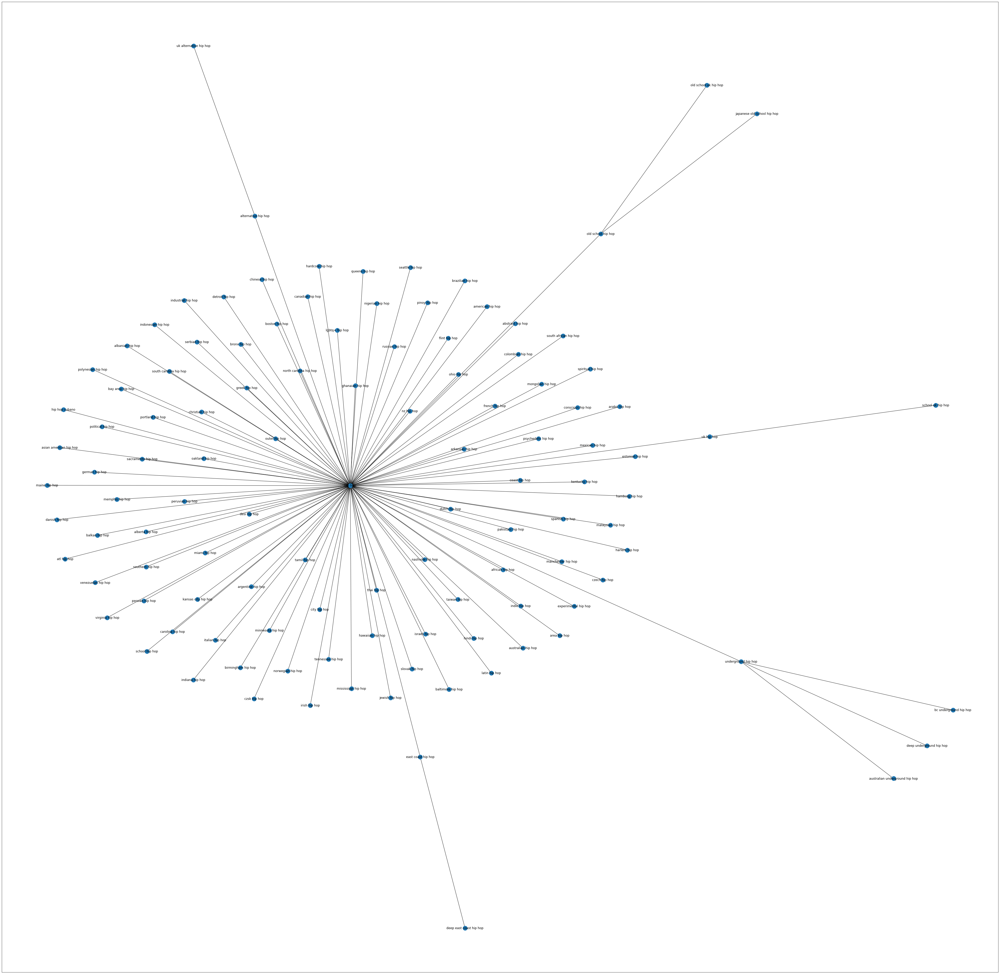

In [53]:
import networkx as nx
plt.subplots(figsize=(70, 70))

val = input("Enter the genre to analyze: ")

G = nx.from_pandas_edgelist(connections_flat_df[connections_flat_df['A'].str.contains(val)], 'A', 'B')
nx.draw_networkx(G)    
# nx.draw(g, node_size = node_sizes, labels=labels, with_labels=True)    


**RECOMMENDATION SYSTEM**

In [ ]:
'''Based on the analysis and visualizations, it’s clear that similar genres tend to have data points that are located close to each other while similar types of songs are also clustered together.
This observation makes perfect sense. Similar genres will sound similar and will come from similar time periods while the same can be said for songs within those genres. We can use this idea to build a recommendation system by taking the data points of the songs a user has listened to and recommending songs corresponding to nearby data points.'''

'Based on the analysis and visualizations, it’s clear that similar genres tend to have data points that are located close to each other while similar types of songs are also clustered together.\nThis observation makes perfect sense. Similar genres will sound similar and will come from similar time periods while the same can be said for songs within those genres. We can use this idea to build a recommendation system by taking the data points of the songs a user has listened to and recommending songs corresponding to nearby data points.'

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans

#Get the numerical data
X = df_by_genre.select_dtypes(np.number)

cluster_pipeline = Pipeline([("scaler", StandardScaler()), \
                             ("kmeans", KMeans(n_clusters=20))])
cluster_pipeline.fit(X)
df_by_genre["general_genre"] = cluster_pipeline.predict(X)

In [ ]:
df_by_genre

,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,general_genre
genres,,,,,,,,,,,,
21st century classical,0.754600,0.284100,3.525932e+05,0.159580,0.484374,0.168580,-22.153400,0.062060,91.351000,0.143380,6.600000,12
432hz,0.485515,0.312000,1.047430e+06,0.391678,0.477250,0.265940,-18.131267,0.071717,118.900933,0.236483,41.200000,5
8-bit,0.028900,0.673000,1.334540e+05,0.950000,0.630000,0.069000,-7.899000,0.292000,192.816000,0.997000,0.000000,7
a cappella,0.694276,0.516172,2.018391e+05,0.330533,0.036080,0.222983,-12.656547,0.083627,105.506031,0.454077,39.086248,11
abstract,0.411262,0.473600,3.660984e+05,0.479400,0.841400,0.097160,-15.799400,0.045300,142.495400,0.274260,43.800000,16
...,...,...,...,...,...,...,...,...,...,...,...,...
zim urban groove,0.003910,0.553000,4.267200e+04,0.942000,0.961000,0.113000,-8.004000,0.039900,134.995000,0.752000,9.000000,0
zolo,0.208648,0.533837,2.641016e+05,0.620470,0.163334,0.201430,-10.878906,0.061828,126.765194,0.576721,31.108254,9
zouk,0.272928,0.641889,4.416418e+05,0.695778,0.257604,0.166011,-9.518889,0.050511,105.848889,0.878444,32.555556,6


In [ ]:
#Next we are clustering the songs with the K-Means we trained.

#This X is from df and the former X was from df_genre

X = df.select_dtypes(np.number)

number_cols = list(X.columns)
cluster_pipeline.fit(X)
cluster_labels = cluster_pipeline.predict(X)
df['general_genre'] = cluster_labels

In [ ]:
from sklearn.decomposition import PCA
pca_pipeline = Pipeline([('scaler', StandardScaler()), \
                         ('PCA', PCA(n_components=3))])
genre_PCA = pca_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=["P1", "P2", "P3"], data=genre_PCA)
projection['cluster'] = df['general_genre']

fig = px.scatter_3d(projection, x="P1", y="P2", z="P3", \
                    color='cluster', template="plotly_dark",
                   width=600, height=600)
fig.show()

In [ ]:
distance_cols = list(X.columns)
df[distance_cols] = df[distance_cols].apply(lambda x: (x - x.min()) / (x.max() - x.min()))
df.drop_duplicates(subset="name", keep="first", inplace=True)

In [ ]:
def get_recommendations(song_name, amount=1):
    song_data = df[df["name"]==song_name]
    song_data = song_data.select_dtypes(np.number)
    genre = int(song_data["general_genre"])
    song_data.drop("general_genre", axis=1, inplace=True)
    df_1 = df[df["name"]!=song_name]
    df_1 = df_1[df_1["general_genre"]==genre]
    #We create a df_2 so we can track the song name in df_1
    df_2=df_1[distance_cols]
    
    #Now we get the distance
    point_a = np.array(song_data)
    distance=[]
    for i in range(df_2.shape[0]):
        point_b = np.array(df_2.iloc[i])
        song_distance = np.linalg.norm(point_a-point_b)
        distance.append(song_distance)
    df_1["distance"]=distance
    df_1.sort_values(by="distance",ascending=True, inplace=True)
    df_1.reset_index(inplace=True)
    
    #Now we print out the song recommendation
    rec_song = df_1.loc[0:amount]
    print("recommendations are")
    for i in range(amount):
        print(rec_song.loc[i]["name"] + " by "+rec_song.loc[i]["artists"])
        


In [ ]:
get_recommendations("Wish You Were Here",5)

recommendations are
The Needle and the Damage Done - 2009 Remaster by ['Neil Young']
After the Love Has Gone by ['Earth, Wind & Fire']
Slip Slidin' Away - Live at Central Park, New York, NY - September 19, 1981 by ['Simon & Garfunkel']
Seven Bridges Road - Live; 1999 Remaster by ['Eagles']
Un Destello De Tu Gloria by ['Jesús Adrián Romero']


In [ ]:
def get_recommendations2(song_name, amount=1):
    song_data = df[df["name"]==song_name]
    song_data = song_data.select_dtypes(np.number)
    genre = int(song_data["general_genre"])
    song_data.drop("general_genre", axis=1, inplace=True)
    df_1 = df[df["name"]!=song_name]
    df_1 = df_1[df_1["general_genre"]==genre]
    #We create a df_2 so we can track the song name in df_1
    df_2=df_1[distance_cols]
    
    #Now we get the distance
    point_a = np.array(song_data)
    distance=[]
    for i in range(df_2.shape[0]):
        point_b = np.array(df_2.iloc[i])
        song_distance = np.linalg.norm(point_a-point_b)
        distance.append(song_distance)
    df_1["distance"]=distance
    df_1.sort_values(by="distance",ascending=True, inplace=True)
    df_1.reset_index(inplace=True)
    
    #Now we print out the song recommendation
    rec_song = df_1.loc[0:amount]
    print("Recommendation for this is")
    for i in range(amount):
        print(rec_song.loc[i]["name"] + " by "+rec_song.loc[i]["artists"])

In [ ]:
get_recommendations("Comfortably Numb",5)

recommendations are
Come Together - Remastered 2009 by ['The Beatles']
Crime Of The Century - Remastered by ['Supertramp']
Tango in the Night - Demo; 2017 Remaster by ['Fleetwood Mac']
The End - Remastered 2009 by ['The Beatles']
I'll Never Love This Way Again by ['Dionne Warwick']
